# Importing Libraries

In [ ]:
import torch
from torch import nn
from torchvision.models import vgg19
import torch.optim as optim
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import os

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

# Implement ESRGAN

In [2]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act, **kwargs):
        super().__init__()
        self.cnn = nn.Conv2d(
            in_channels,
            out_channels,
            **kwargs,
            bias=True,
        )
        self.act = nn.LeakyReLU(0.2, inplace=True) if use_act else nn.Identity()

    def forward(self, x):
        return self.act(self.cnn(x))


class UpsampleBlock(nn.Module):
    def __init__(self, in_c, scale_factor=2):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=scale_factor, mode="nearest")
        self.conv = nn.Conv2d(in_c, in_c, 3, 1, 1, bias=True)
        self.act = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, x):
        return self.act(self.conv(self.upsample(x)))


class DenseResidualBlock(nn.Module):
    def __init__(self, in_channels, channels=32, residual_beta=0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.blocks = nn.ModuleList()

        for i in range(5):
            self.blocks.append(
                ConvBlock(
                    in_channels + channels * i,
                    channels if i <= 3 else in_channels,
                    kernel_size=3,
                    stride=1,
                    padding=1,
                    use_act=True if i <= 3 else False,
                )
            )

    def forward(self, x):
        new_inputs = x
        for block in self.blocks:
            out = block(new_inputs)
            new_inputs = torch.cat([new_inputs, out], dim=1)
        return self.residual_beta * out + x


class RRDB(nn.Module):
    def __init__(self, in_channels, residual_beta=0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.rrdb = nn.Sequential(*[DenseResidualBlock(in_channels) for _ in range(3)])

    def forward(self, x):
        return self.rrdb(x) * self.residual_beta + x


class Generator(nn.Module):
    def __init__(self, in_channels=3, num_channels=64, num_blocks=23):
        super().__init__()
        self.initial = nn.Conv2d(
            in_channels,
            num_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=True,
        )
        self.residuals = nn.Sequential(*[RRDB(num_channels) for _ in range(num_blocks)])
        self.conv = nn.Conv2d(num_channels, num_channels, kernel_size=3, stride=1, padding=1)
        self.upsamples = nn.Sequential(
            UpsampleBlock(num_channels), UpsampleBlock(num_channels),
        )
        self.final = nn.Sequential(
            nn.Conv2d(num_channels, num_channels, 3, 1, 1, bias=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(num_channels, in_channels, 3, 1, 1, bias=True),
        )

    def forward(self, x):
        initial = self.initial(x)
        x = self.conv(self.residuals(initial)) + initial
        x = self.upsamples(x)
        return self.final(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 64, 128, 128, 256, 256, 512, 512]):
        super().__init__()
        blocks = []
        for idx, feature in enumerate(features):
            blocks.append(
                ConvBlock(
                    in_channels,
                    feature,
                    kernel_size=3,
                    stride=1 + idx % 2,
                    padding=1,
                    use_act=True,
                ),
            )
            in_channels = feature

        self.blocks = nn.Sequential(*blocks)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((6, 6)),
            nn.Flatten(),
            nn.Linear(512 * 6 * 6, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1),
        )

    def forward(self, x):
        x = self.blocks(x)
        return self.classifier(x)

def initialize_weights(model, scale=0.1):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale

        elif isinstance(m, nn.Linear):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale

In [3]:
# defining VGGLoss and gradient_penalty
class VGGLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.vgg = vgg19(pretrained=True).features[:35].eval().to(config.DEVICE)

        for param in self.vgg.parameters():
            param.requires_grad = False

        self.loss = nn.MSELoss()

    def forward(self, input, target):
        vgg_input_features = self.vgg(input)
        vgg_target_features = self.vgg(target)
        return self.loss(vgg_input_features, vgg_target_features)

def gradient_penalty(critic, real, fake, device):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake.detach() * (1 - alpha)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

# configuration and augumentation
The configuration needs to be done correctly, Thus define the respective paths.

In [4]:
class config:
    LEARNING_RATE = 1e-4
    DEVICE = "cuda"
    LOAD_MODEL = True
    SAVE_MODEL = True
    CHECKPOINT_GEN = "gen.pth" # path to save the weights
    CHECKPOINT_DISC = "disc.pth"
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    LEARNING_RATE = 1e-4
    NUM_EPOCHS = 500
    BATCH_SIZE = 16
    LAMBDA_GP = 10
    NUM_WORKERS = 4
    HIGH_RES = 128
    LOW_RES = 32
    IMG_CHANNELS = 3
    Pretrained_Weights = "gen.pth" # saved pretrained weights

highres= A.Compose(
    [
        A.Normalize(mean=[0, 0, 0], std=[1, 1, 1]),
        ToTensorV2(),
    ]
)

lowres = A.Compose(
    [
        A.Resize(width=config.LOW_RES, height=config.LOW_RES, interpolation=Image.BICUBIC),
        A.Normalize(mean=[0, 0, 0], std=[1, 1, 1]),
        ToTensorV2(),
    ]
)

testlowres = A.Compose(
    [
        A.Resize(width=config.LOW_RES, height=config.LOW_RES),
        A.Normalize(mean=[0, 0, 0], std=[1, 1, 1]),
        ToTensorV2(),
    ]
)
transform = A.Compose(
    [
        A.CenterCrop(width=config.HIGH_RES, height=config.HIGH_RES)
    ]
)


The model is to big to be trained on kaggle, thus for the sake of clarity we will only train the model on Hugh Jackman with celebrity dataset for now.

In [5]:
class customdataset(Dataset):
    def __init__(self, path):
        self.path = path
    def __len__(self):
        return len(self.path)
    def __getitem__(self, idx):
        
        path = "celebrity-face-image-dataset/Celebrity Faces Dataset/Hugh Jackman/" + self.path[idx]
        high_res = Image.open(path)
        low_res = Image.open(path)
        
        high_res = transform(image = np.array(high_res))["image"]
        low_res = transform(image = np.array(low_res))["image"]

        high_res = highres(image = np.array(high_res))["image"]
        low_res =  lowres(image = np.array(low_res))["image"]
        
        return high_res , low_res

In [6]:
def plot_examples(hr , fake , lr):
    fake = fake.type(torch.cuda.FloatTensor)
    f, ax= plt.subplots(1,3, figsize=(10, 3))
    ax[0].imshow(np.array(torch.permute( lr[0] , (1 , 2 , 0 )).cpu().detach()), aspect='auto')
    ax[1].imshow(np.array(torch.permute( fake[0] , (1 , 2 , 0 )).cpu().detach()), aspect='auto')
    ax[2].imshow(np.array(torch.permute( hr[0] , (1 , 2 , 0 )).cpu().detach()), aspect='auto')
    plt.show()  

We will first train the model, but if you want to directly run 
few tests you can also use the PretrainedWeights

In [7]:
def train_epoch(
    loader,
    disc,
    gen,
    opt_gen,
    opt_disc,
    l1,
    vgg_loss,
    g_scaler,
    d_scaler
):
    loop = loader

    for idx, (high_res , low_res) in enumerate(loop):
        high_res = high_res.to(config.DEVICE)
        low_res = low_res.to(config.DEVICE)

        with torch.cuda.amp.autocast():
            fake = gen(low_res)
            critic_real = disc(high_res)
            critic_fake = disc(fake.detach())
            gp = gradient_penalty(disc, high_res, fake, device=config.DEVICE)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake))
                + config.LAMBDA_GP * gp
            )

        opt_disc.zero_grad()
        d_scaler.scale(loss_critic).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        with torch.cuda.amp.autocast():
            l1_loss = 1e-2 * l1(fake, high_res)
            adversarial_loss = 5e-3 * -torch.mean(disc(fake))
            loss_for_vgg = vgg_loss(fake, high_res)
            gen_loss = l1_loss + loss_for_vgg + adversarial_loss

        opt_gen.zero_grad()
        g_scaler.scale(gen_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        metrics = {
            "gp" : "{:.4f}".format(gp.item()),
            "critic" : "{:.4f}".format(loss_critic.item()),
            "l1" : "{:.4f}".format(l1_loss.item()),
            "vgg" : "{:.4f}".format(loss_for_vgg.item()),
            "adversarial" : "{:.4f}".format(adversarial_loss.item()),
        }

    return low_res , fake , high_res , metrics


def train():
    gen.train()
    disc.train()
    
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()
    
    for epoch in range(1000):
        
        lr , fake , hr , metrics = train_epoch(
            loader,
            disc,
            gen,
            opt_gen,
            opt_disc,
            l1,
            vgg_loss,
            g_scaler,
            d_scaler
        )

        if epoch%10 == 0 and epoch != 0:
            print("epoch: {}".format(epoch))
            print(metrics)
            print("\n")
            plot_examples(lr , fake , hr)
        if config.SAVE_MODEL:
            torch.save(gen.state_dict() , config.CHECKPOINT_GEN)
            torch.save(disc.state_dict() , config.CHECKPOINT_DISC)


/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also u

epoch: 10
{'gp': '0.0706', 'critic': '-5.1062', 'l1': '0.0027', 'vgg': '5.7419', 'adversarial': '-0.3271'}




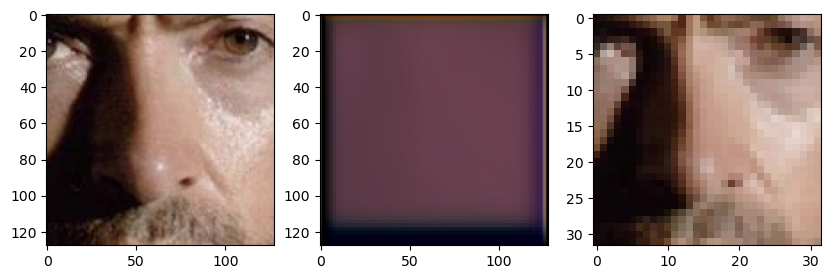

epoch: 20
{'gp': '0.4823', 'critic': '-11.5050', 'l1': '0.0024', 'vgg': '4.2463', 'adversarial': '-0.0229'}




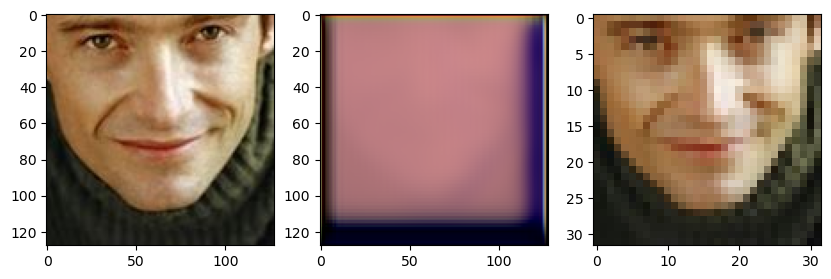

epoch: 30
{'gp': '0.6612', 'critic': '-43.8255', 'l1': '0.0036', 'vgg': '6.9555', 'adversarial': '0.6455'}




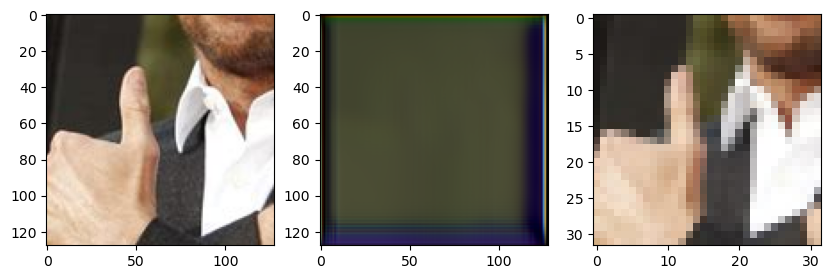

epoch: 40
{'gp': '1.4298', 'critic': '-52.3273', 'l1': '0.0022', 'vgg': '5.7312', 'adversarial': '0.5127'}




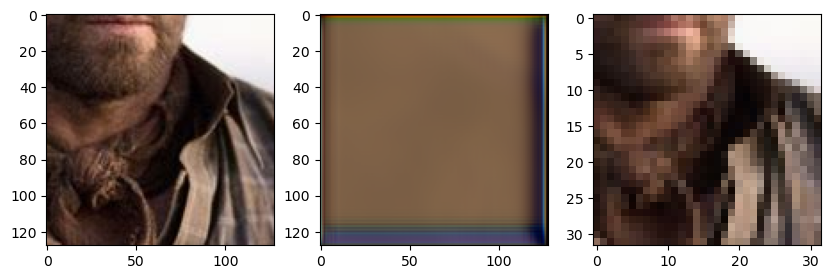

epoch: 50
{'gp': '0.9235', 'critic': '-49.0462', 'l1': '0.0020', 'vgg': '6.1680', 'adversarial': '0.4929'}




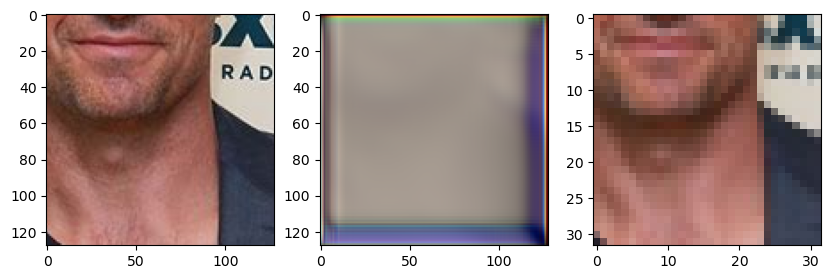

epoch: 60
{'gp': '1.1387', 'critic': '-44.9879', 'l1': '0.0019', 'vgg': '4.6263', 'adversarial': '0.6548'}




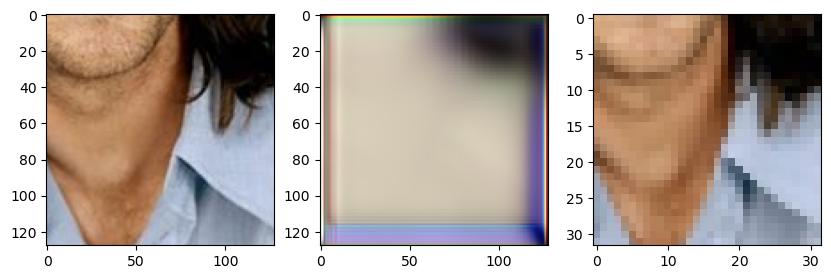

epoch: 70
{'gp': '1.4003', 'critic': '-42.1532', 'l1': '0.0014', 'vgg': '3.8355', 'adversarial': '0.8311'}




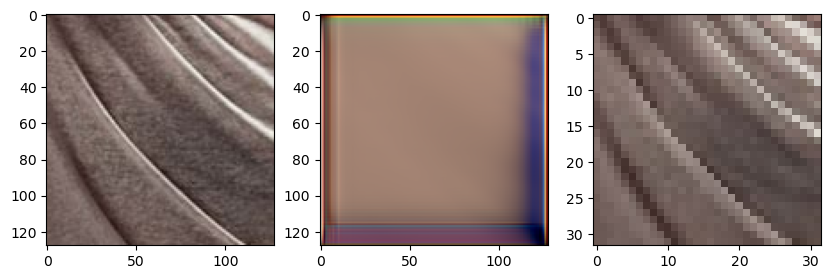

epoch: 80
{'gp': '1.1037', 'critic': '-38.4634', 'l1': '0.0016', 'vgg': '4.1586', 'adversarial': '0.8096'}




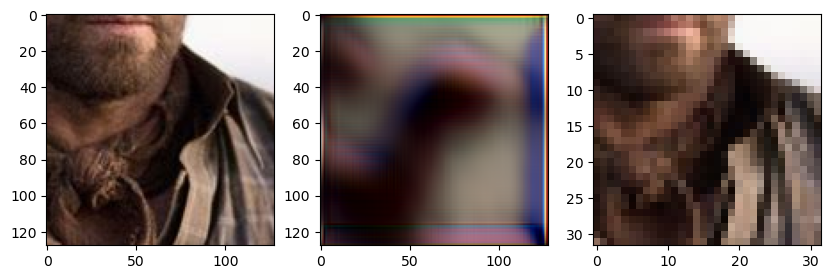

epoch: 90
{'gp': '1.3899', 'critic': '-43.2886', 'l1': '0.0019', 'vgg': '4.1814', 'adversarial': '0.5767'}




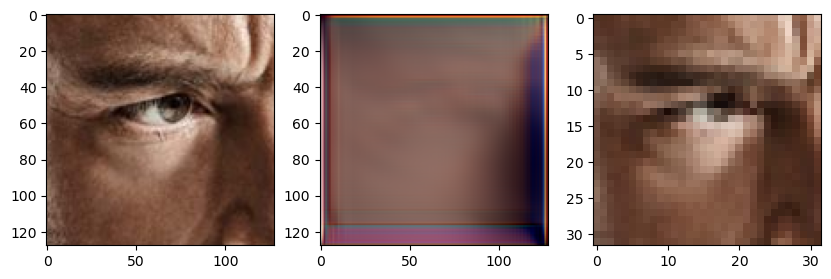

epoch: 100
{'gp': '2.1465', 'critic': '-57.0355', 'l1': '0.0018', 'vgg': '5.3717', 'adversarial': '0.6533'}




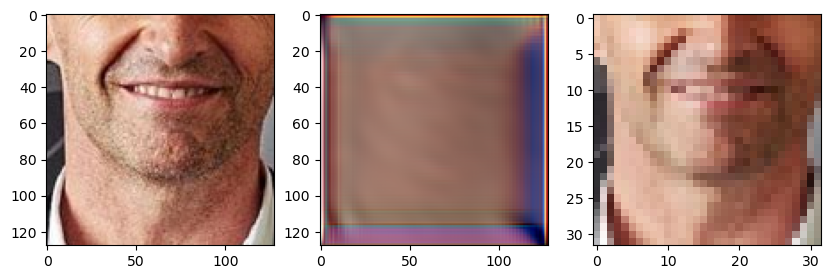

epoch: 110
{'gp': '1.0988', 'critic': '-35.6375', 'l1': '0.0019', 'vgg': '4.7802', 'adversarial': '0.4038'}




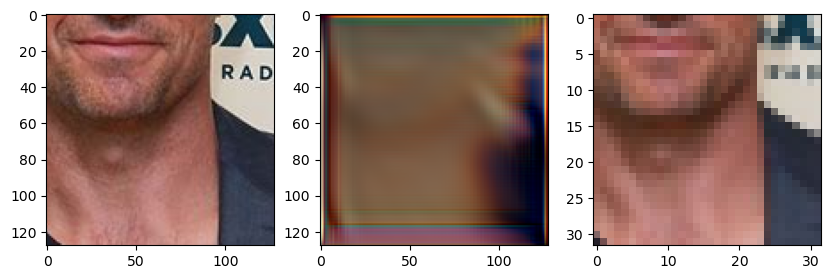

epoch: 120
{'gp': '1.8746', 'critic': '-51.9416', 'l1': '0.0018', 'vgg': '4.9181', 'adversarial': '0.3831'}




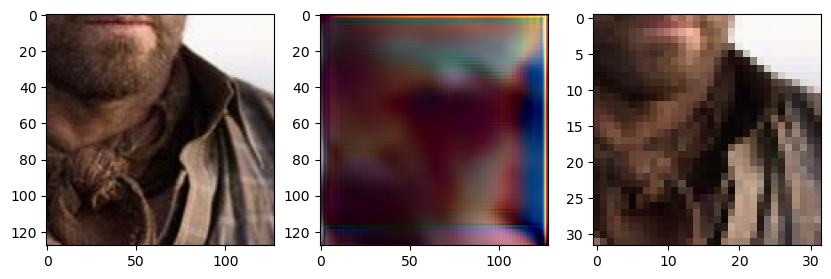

epoch: 130
{'gp': '1.1943', 'critic': '-36.8699', 'l1': '0.0017', 'vgg': '3.3954', 'adversarial': '-0.2781'}




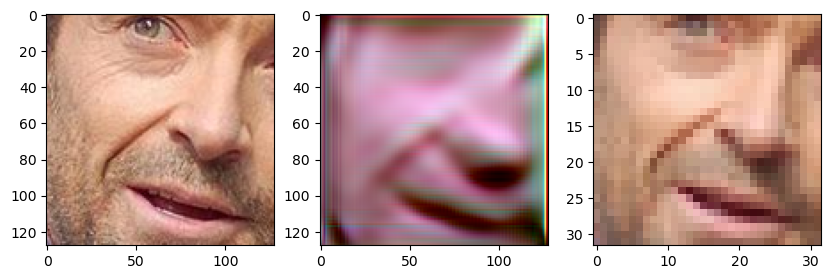

epoch: 140
{'gp': '0.5963', 'critic': '-30.1616', 'l1': '0.0017', 'vgg': '2.7800', 'adversarial': '0.8037'}




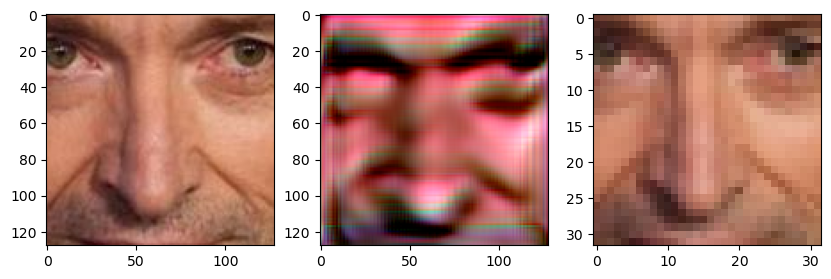

epoch: 150
{'gp': '0.3712', 'critic': '-21.2258', 'l1': '0.0012', 'vgg': '2.1577', 'adversarial': '0.3040'}




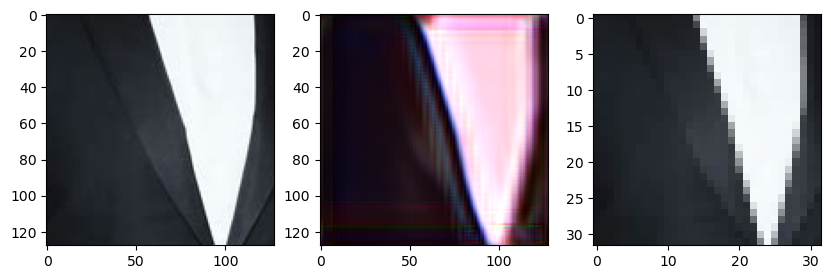

epoch: 160
{'gp': '0.3601', 'critic': '-17.0869', 'l1': '0.0010', 'vgg': '2.2591', 'adversarial': '0.5195'}




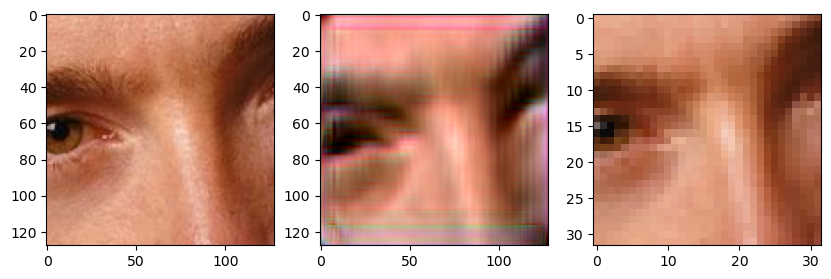

epoch: 170
{'gp': '0.3072', 'critic': '-15.4909', 'l1': '0.0013', 'vgg': '2.0393', 'adversarial': '0.7573'}




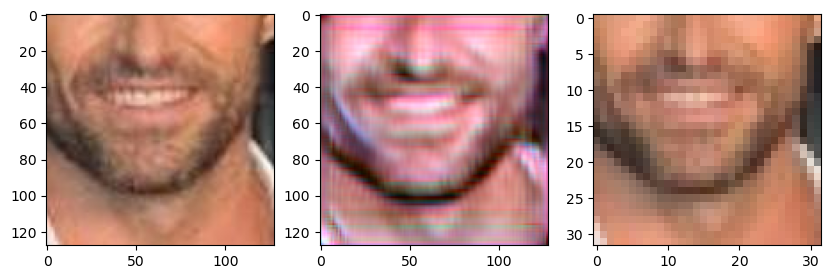

epoch: 180
{'gp': '0.2882', 'critic': '-20.0555', 'l1': '0.0011', 'vgg': '1.8532', 'adversarial': '0.6250'}




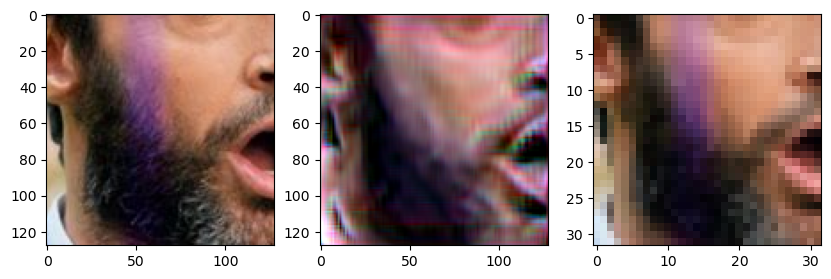

epoch: 190
{'gp': '0.2781', 'critic': '-12.0310', 'l1': '0.0010', 'vgg': '1.2363', 'adversarial': '0.2759'}




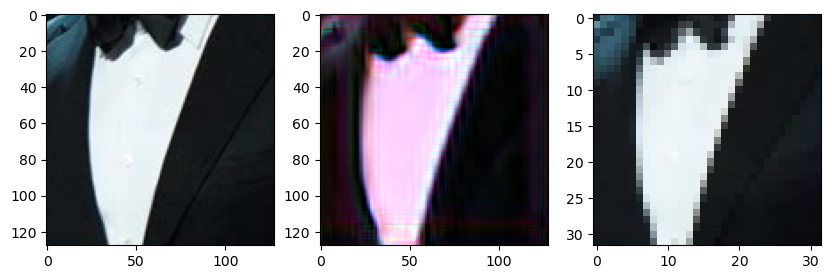

epoch: 200
{'gp': '0.2829', 'critic': '-18.3587', 'l1': '0.0010', 'vgg': '1.9254', 'adversarial': '0.3997'}




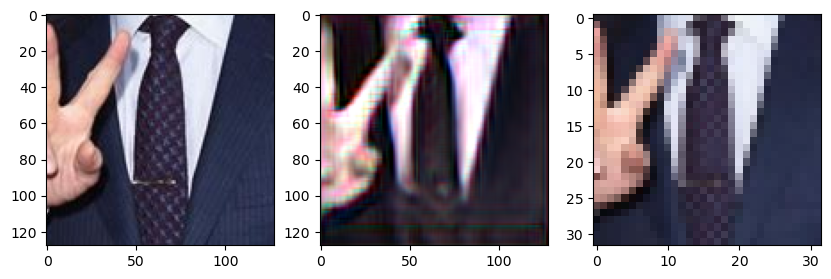

epoch: 210
{'gp': '0.4355', 'critic': '-10.8947', 'l1': '0.0010', 'vgg': '0.9505', 'adversarial': '0.3237'}




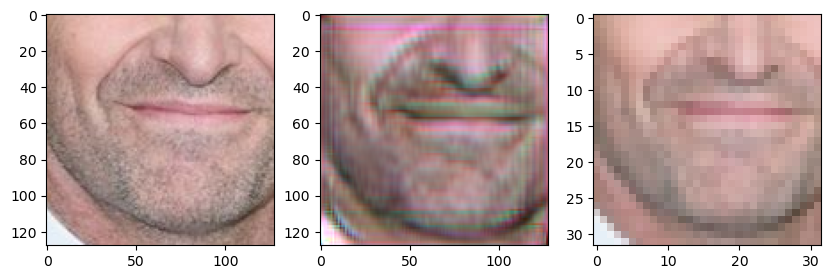

epoch: 220
{'gp': '0.3519', 'critic': '-10.4346', 'l1': '0.0007', 'vgg': '1.3316', 'adversarial': '0.2147'}




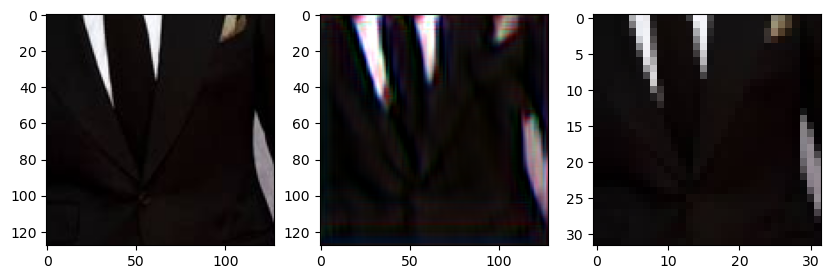

epoch: 230
{'gp': '0.1470', 'critic': '-26.4362', 'l1': '0.0016', 'vgg': '2.3012', 'adversarial': '0.6924'}




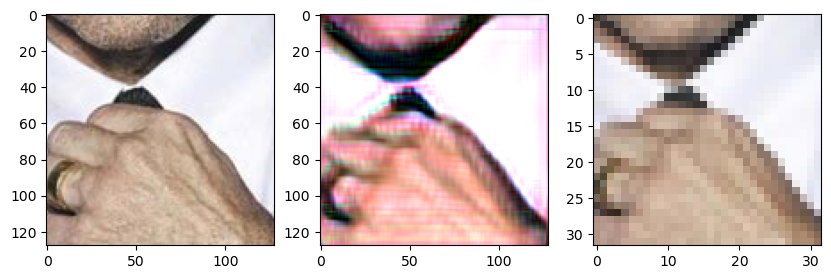

epoch: 240
{'gp': '0.2532', 'critic': '-9.6557', 'l1': '0.0008', 'vgg': '0.7818', 'adversarial': '0.1423'}




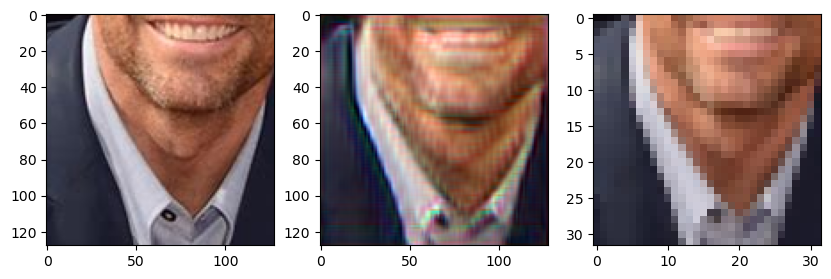

epoch: 250
{'gp': '0.3387', 'critic': '-13.0195', 'l1': '0.0009', 'vgg': '1.1398', 'adversarial': '0.1248'}




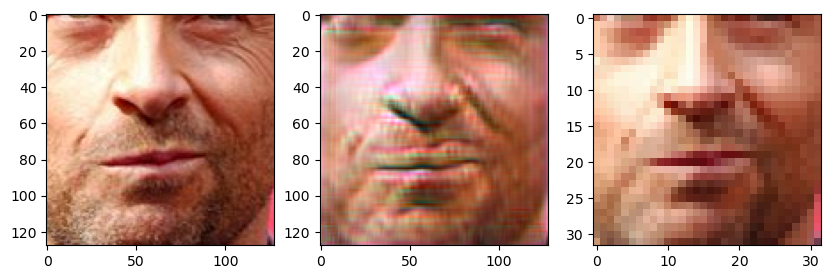

epoch: 260
{'gp': '0.3766', 'critic': '-12.7656', 'l1': '0.0008', 'vgg': '0.9068', 'adversarial': '0.1117'}




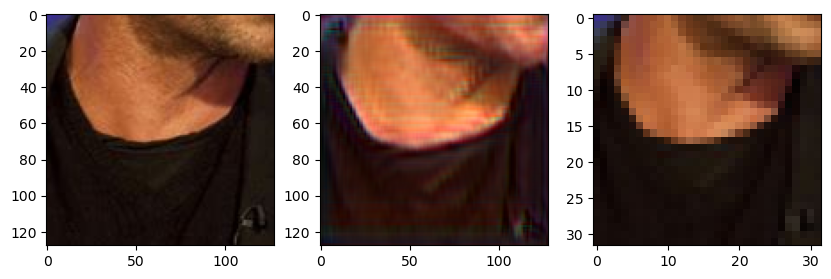

epoch: 270
{'gp': '0.4815', 'critic': '-16.9192', 'l1': '0.0008', 'vgg': '1.0139', 'adversarial': '0.1635'}




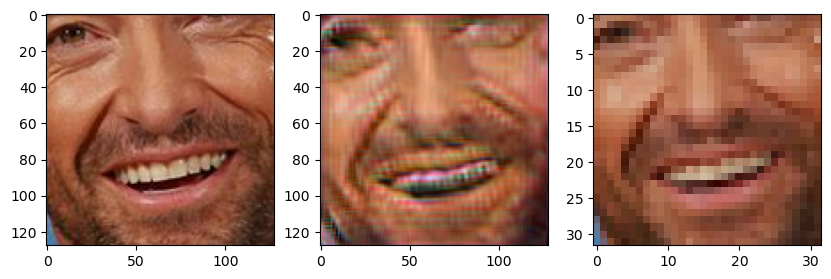

epoch: 280
{'gp': '0.2498', 'critic': '-13.4157', 'l1': '0.0007', 'vgg': '0.7885', 'adversarial': '0.1000'}




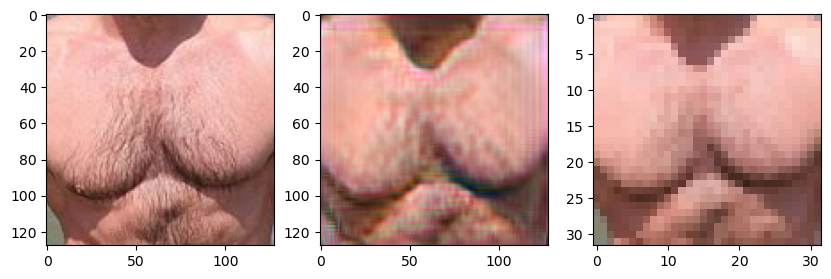

epoch: 290
{'gp': '0.2104', 'critic': '-15.1152', 'l1': '0.0008', 'vgg': '0.8213', 'adversarial': '0.2815'}




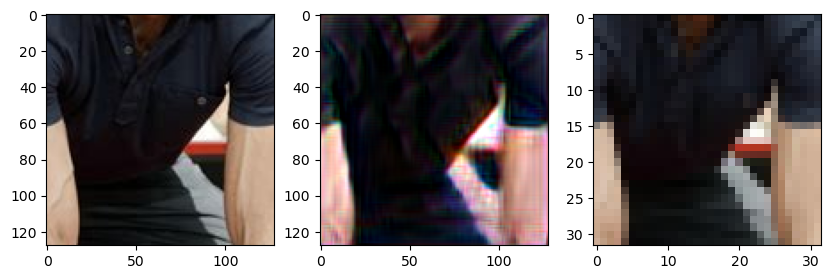

epoch: 300
{'gp': '0.4786', 'critic': '-16.8079', 'l1': '0.0009', 'vgg': '0.9768', 'adversarial': '0.0406'}




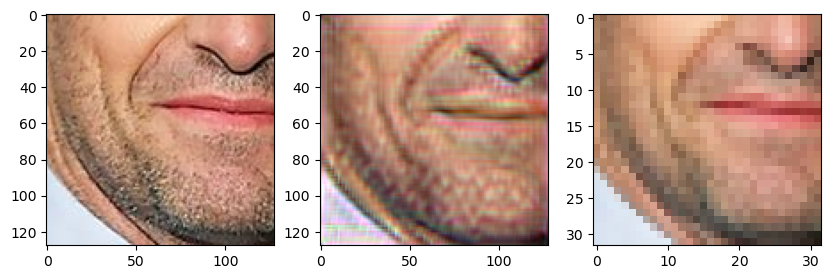

epoch: 310
{'gp': '0.2082', 'critic': '-13.7075', 'l1': '0.0007', 'vgg': '0.6366', 'adversarial': '0.1001'}




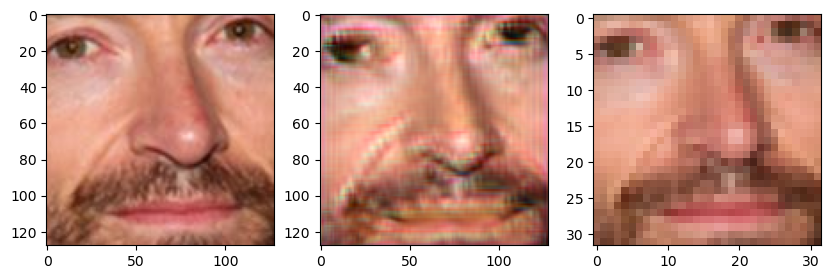

epoch: 320
{'gp': '0.2413', 'critic': '-14.8995', 'l1': '0.0007', 'vgg': '0.6997', 'adversarial': '0.1205'}




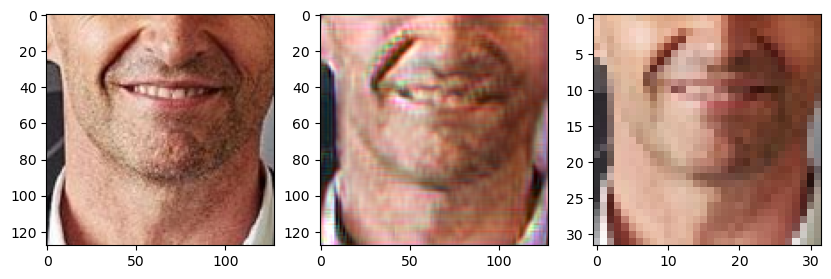

epoch: 330
{'gp': '0.2902', 'critic': '-15.7386', 'l1': '0.0007', 'vgg': '0.6305', 'adversarial': '0.1594'}




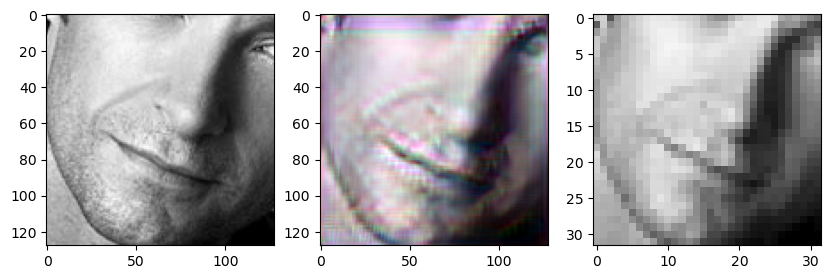

epoch: 340
{'gp': '0.5111', 'critic': '-13.3267', 'l1': '0.0007', 'vgg': '0.5811', 'adversarial': '-0.0166'}




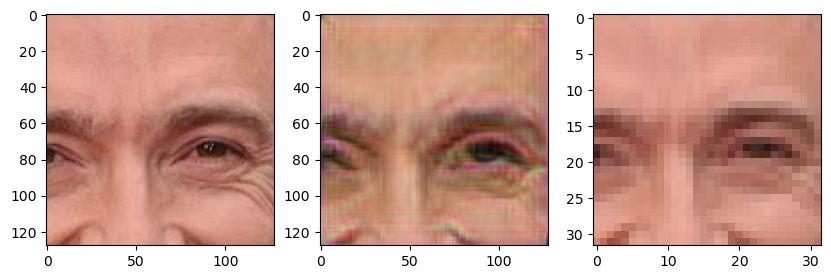

epoch: 350
{'gp': '0.2993', 'critic': '-16.4129', 'l1': '0.0007', 'vgg': '0.7183', 'adversarial': '0.0977'}




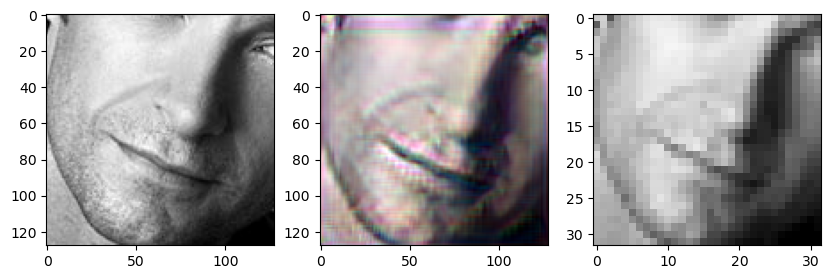

epoch: 360
{'gp': '0.2536', 'critic': '-12.2763', 'l1': '0.0006', 'vgg': '0.5431', 'adversarial': '0.1528'}




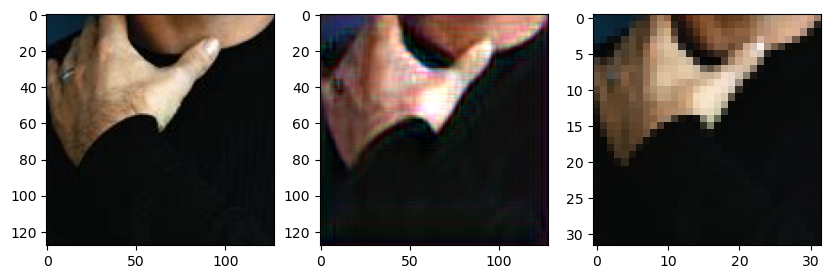

epoch: 370
{'gp': '0.2447', 'critic': '-14.3655', 'l1': '0.0006', 'vgg': '0.4221', 'adversarial': '0.1260'}




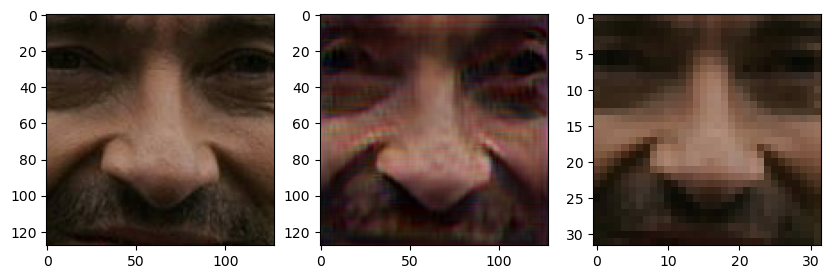

epoch: 380
{'gp': '0.4147', 'critic': '-13.4000', 'l1': '0.0006', 'vgg': '0.4353', 'adversarial': '0.0618'}




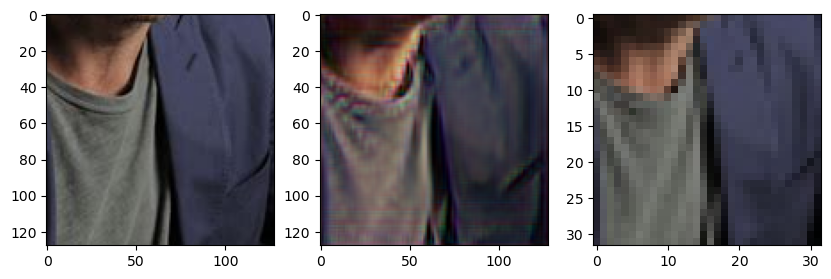

epoch: 390
{'gp': '0.2652', 'critic': '-13.8013', 'l1': '0.0006', 'vgg': '0.4710', 'adversarial': '0.0432'}




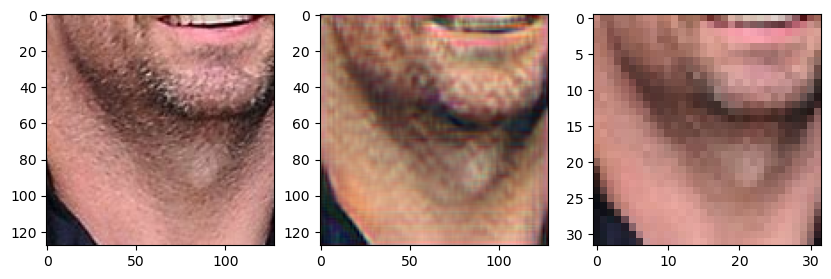

epoch: 400
{'gp': '0.2061', 'critic': '-10.9783', 'l1': '0.0005', 'vgg': '0.4069', 'adversarial': '0.0998'}




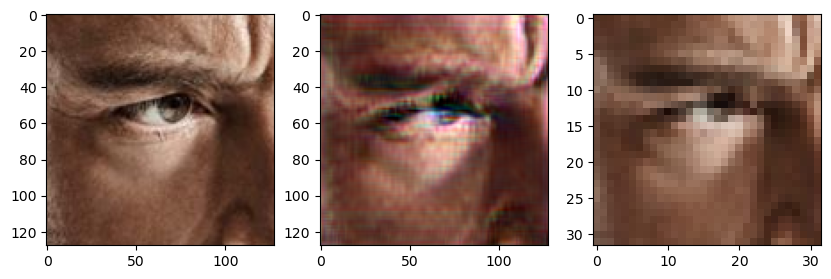

epoch: 410
{'gp': '0.2070', 'critic': '-17.7739', 'l1': '0.0007', 'vgg': '0.5113', 'adversarial': '0.0847'}




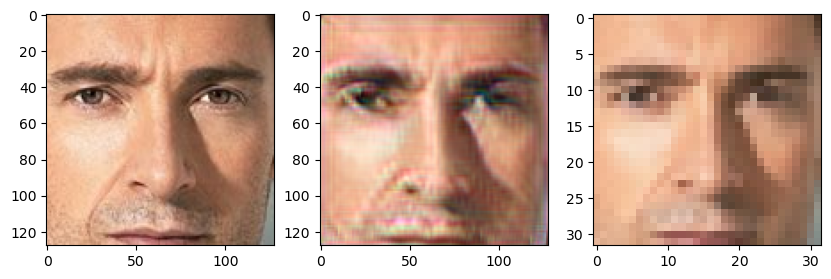

epoch: 420
{'gp': '0.2518', 'critic': '-10.9117', 'l1': '0.0005', 'vgg': '0.4212', 'adversarial': '0.1499'}




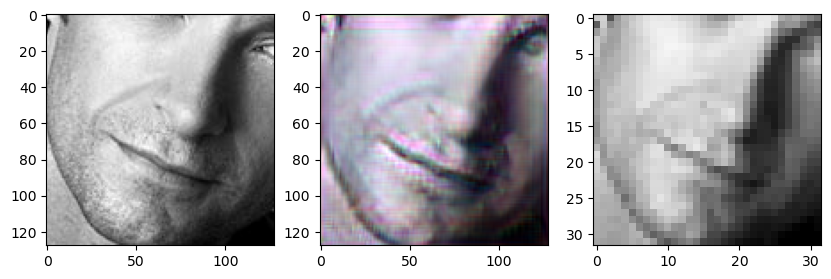

epoch: 430
{'gp': '0.2526', 'critic': '-14.5370', 'l1': '0.0006', 'vgg': '0.3718', 'adversarial': '0.1202'}




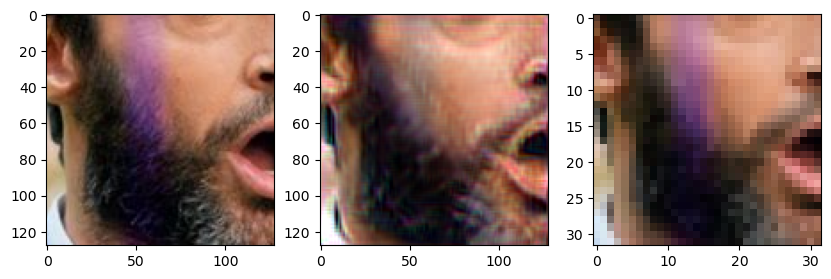

epoch: 440
{'gp': '0.3572', 'critic': '-17.8656', 'l1': '0.0006', 'vgg': '0.4507', 'adversarial': '0.0602'}




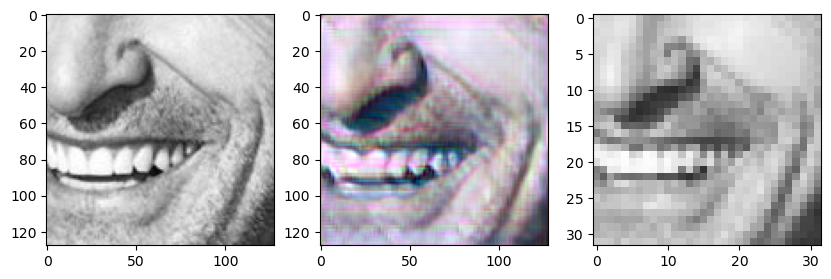

epoch: 450
{'gp': '0.2373', 'critic': '-9.5336', 'l1': '0.0004', 'vgg': '0.3592', 'adversarial': '0.1005'}




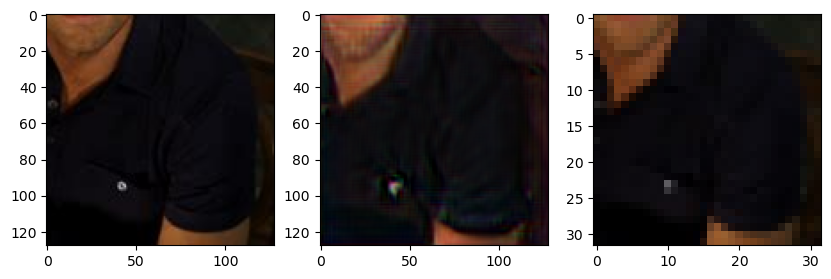

epoch: 460
{'gp': '0.3644', 'critic': '-17.2779', 'l1': '0.0006', 'vgg': '0.3396', 'adversarial': '0.0427'}




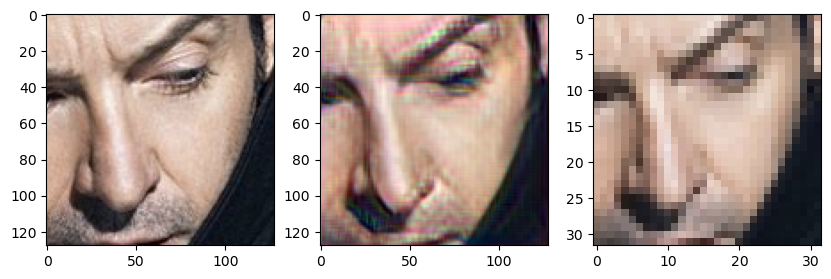

epoch: 470
{'gp': '0.2284', 'critic': '-12.3093', 'l1': '0.0006', 'vgg': '0.4936', 'adversarial': '0.1304'}




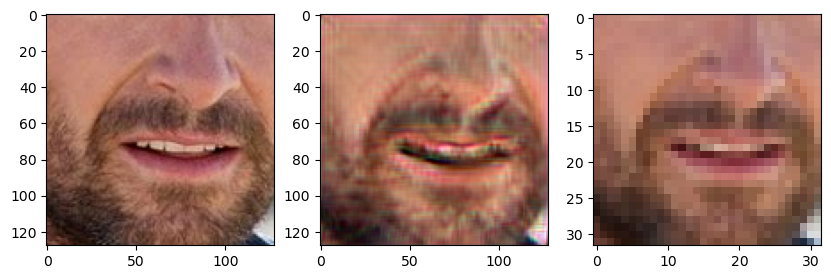

epoch: 480
{'gp': '0.3730', 'critic': '-12.0827', 'l1': '0.0006', 'vgg': '0.4543', 'adversarial': '0.1046'}




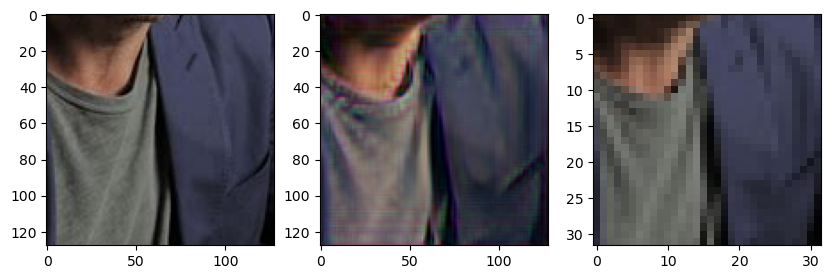

epoch: 490
{'gp': '0.4515', 'critic': '-17.3132', 'l1': '0.0006', 'vgg': '0.4112', 'adversarial': '0.0421'}




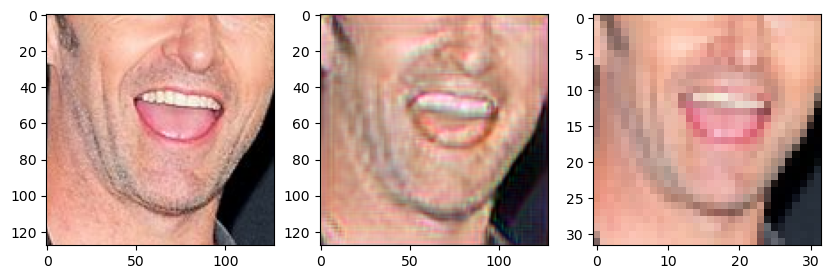

epoch: 500
{'gp': '0.2562', 'critic': '-14.0477', 'l1': '0.0006', 'vgg': '0.3083', 'adversarial': '0.1722'}




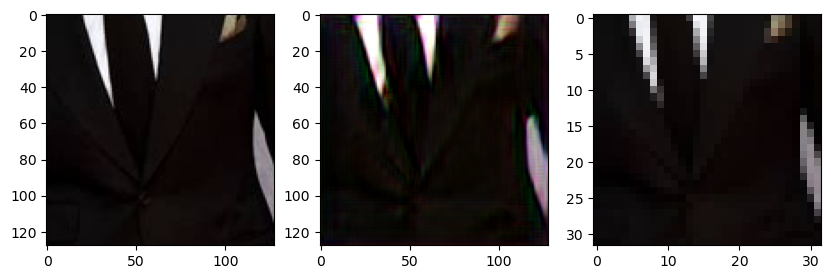

epoch: 510
{'gp': '0.3460', 'critic': '-15.0865', 'l1': '0.0005', 'vgg': '0.2925', 'adversarial': '0.1163'}




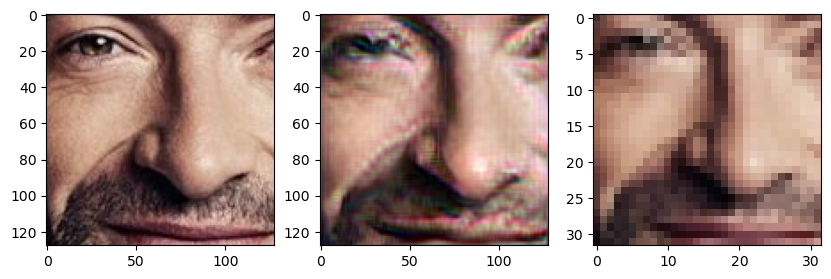

epoch: 520
{'gp': '0.3850', 'critic': '-18.4941', 'l1': '0.0006', 'vgg': '0.3332', 'adversarial': '0.1016'}




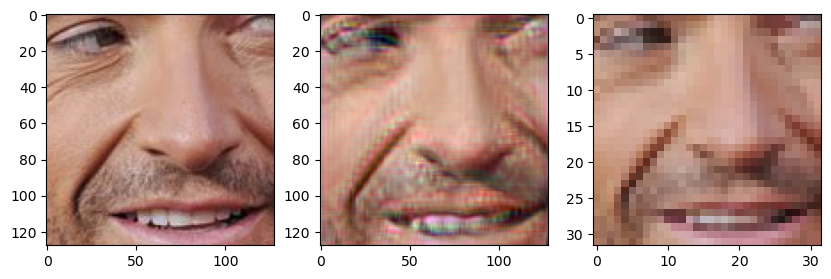

epoch: 530
{'gp': '0.3511', 'critic': '-14.8793', 'l1': '0.0005', 'vgg': '0.2833', 'adversarial': '0.1163'}




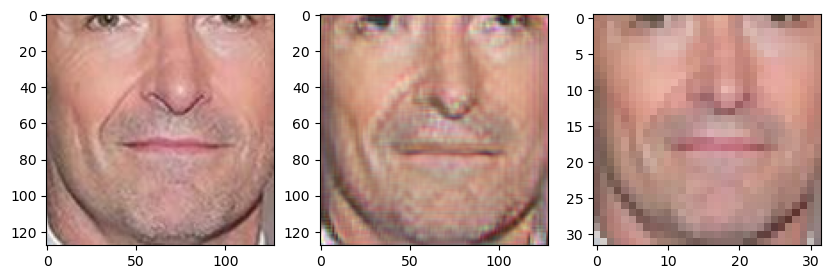

epoch: 540
{'gp': '0.2660', 'critic': '-11.2302', 'l1': '0.0005', 'vgg': '0.3030', 'adversarial': '0.1360'}




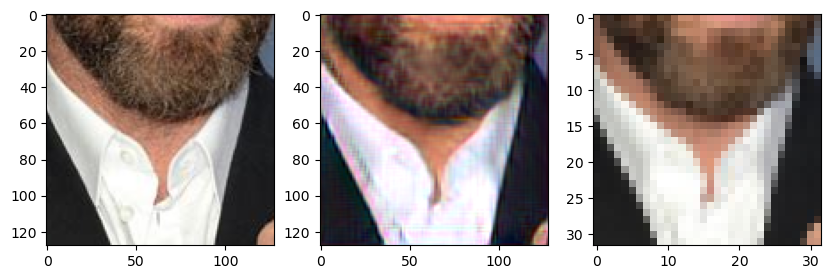

epoch: 550
{'gp': '0.2165', 'critic': '-9.4755', 'l1': '0.0004', 'vgg': '0.2148', 'adversarial': '0.1113'}




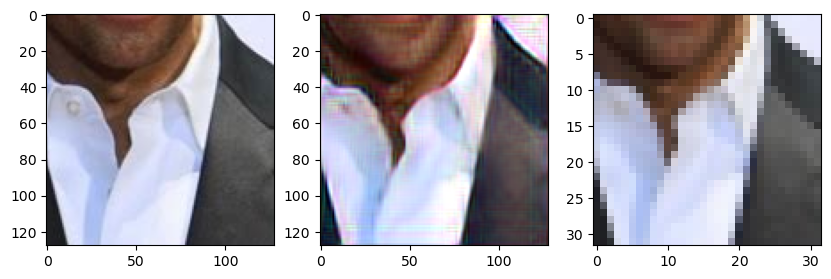

epoch: 560
{'gp': '0.3733', 'critic': '-16.3610', 'l1': '0.0006', 'vgg': '0.3325', 'adversarial': '0.0455'}




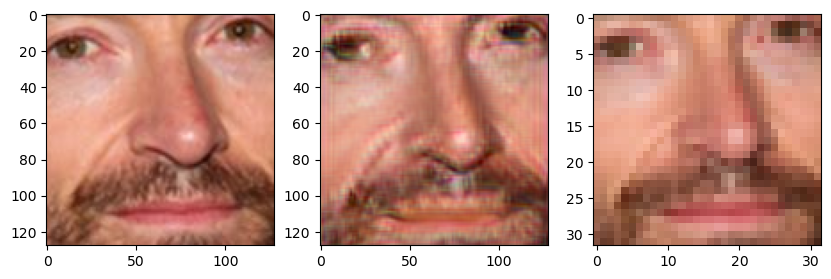

epoch: 570
{'gp': '0.2756', 'critic': '-12.1975', 'l1': '0.0005', 'vgg': '0.2837', 'adversarial': '0.0306'}




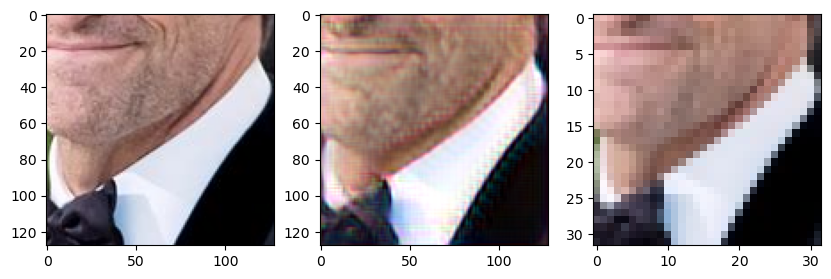

epoch: 580
{'gp': '0.3202', 'critic': '-14.9078', 'l1': '0.0005', 'vgg': '0.2135', 'adversarial': '0.0712'}




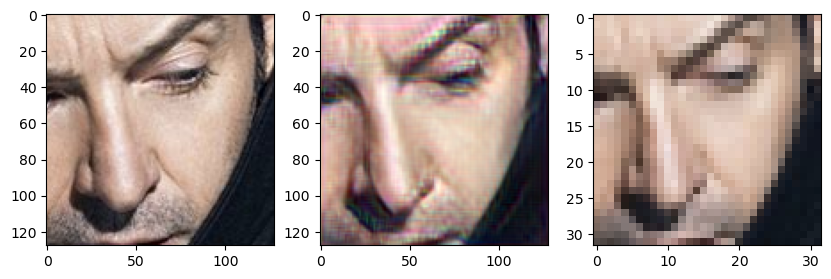

epoch: 590
{'gp': '0.5601', 'critic': '-19.6332', 'l1': '0.0006', 'vgg': '0.3042', 'adversarial': '0.0984'}




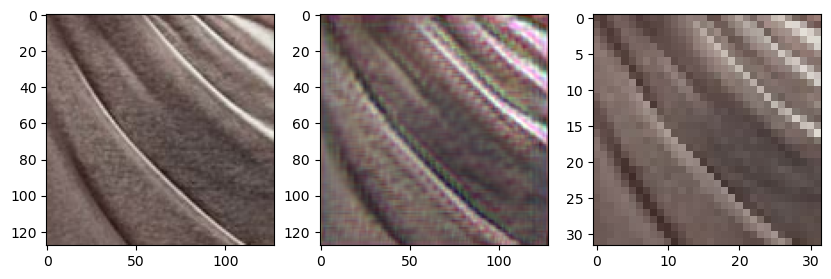

epoch: 600
{'gp': '0.2894', 'critic': '-12.2938', 'l1': '0.0005', 'vgg': '0.2667', 'adversarial': '0.0298'}




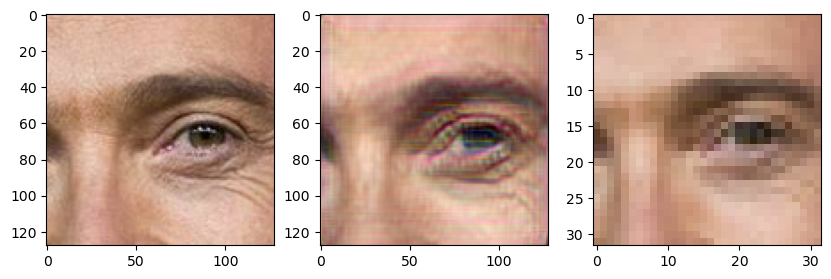

epoch: 610
{'gp': '0.2575', 'critic': '-14.8625', 'l1': '0.0005', 'vgg': '0.2861', 'adversarial': '0.0652'}




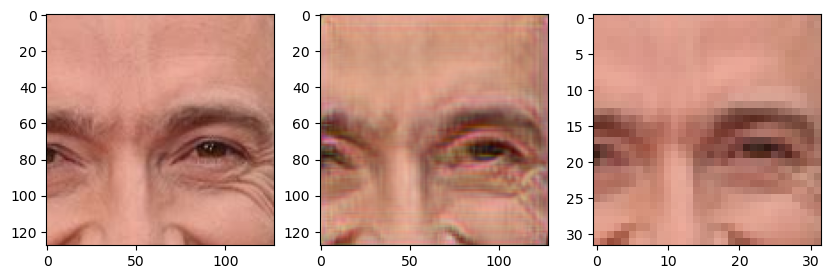

epoch: 620
{'gp': '0.3591', 'critic': '-12.3071', 'l1': '0.0005', 'vgg': '0.3304', 'adversarial': '0.0702'}




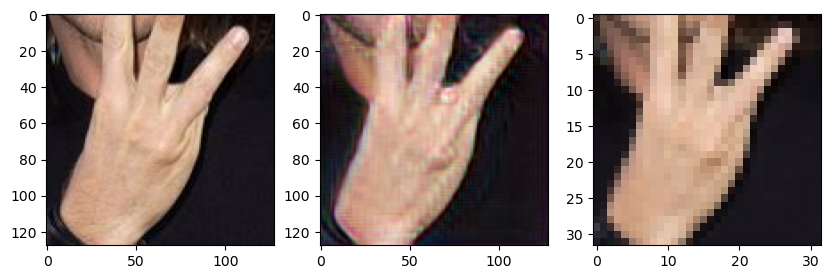

epoch: 630
{'gp': '0.3013', 'critic': '-14.7059', 'l1': '0.0006', 'vgg': '0.2648', 'adversarial': '0.0631'}




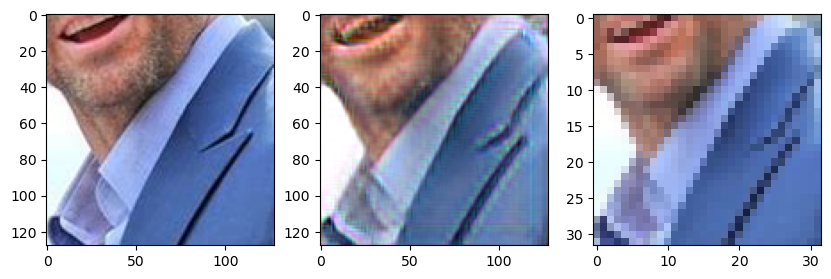

epoch: 640
{'gp': '0.2976', 'critic': '-11.9928', 'l1': '0.0005', 'vgg': '0.2006', 'adversarial': '0.0632'}




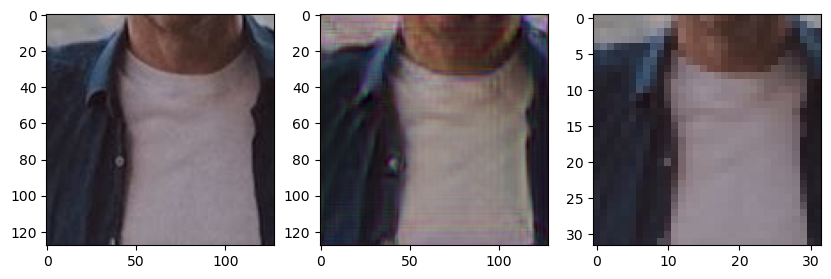

epoch: 650
{'gp': '0.1565', 'critic': '-10.2791', 'l1': '0.0004', 'vgg': '0.2004', 'adversarial': '0.0417'}




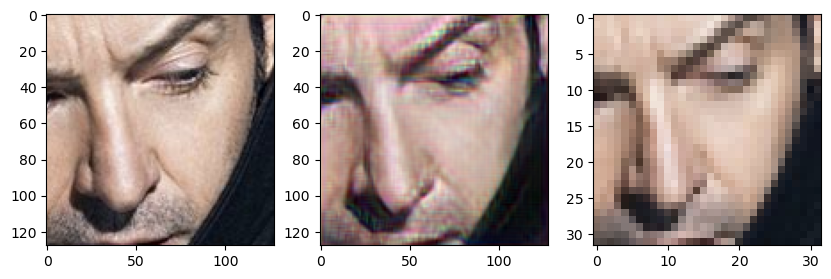

epoch: 660
{'gp': '0.3075', 'critic': '-18.1596', 'l1': '0.0006', 'vgg': '0.2582', 'adversarial': '0.0448'}




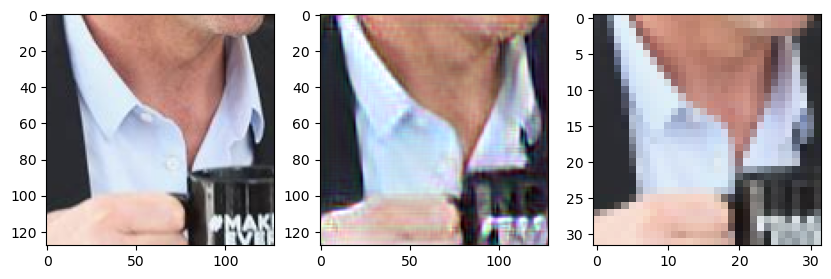

epoch: 670
{'gp': '0.2648', 'critic': '-13.6805', 'l1': '0.0005', 'vgg': '0.2021', 'adversarial': '0.0399'}




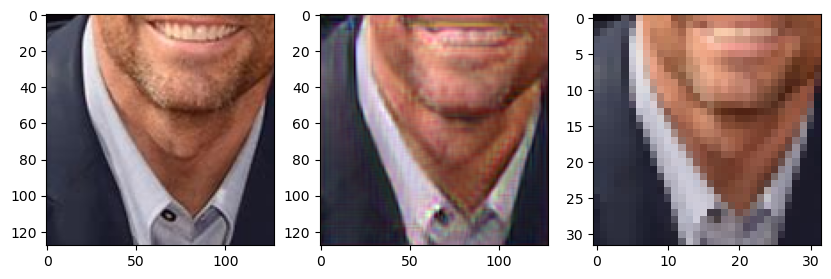

epoch: 680
{'gp': '0.1861', 'critic': '-11.6933', 'l1': '0.0005', 'vgg': '0.3005', 'adversarial': '0.0338'}




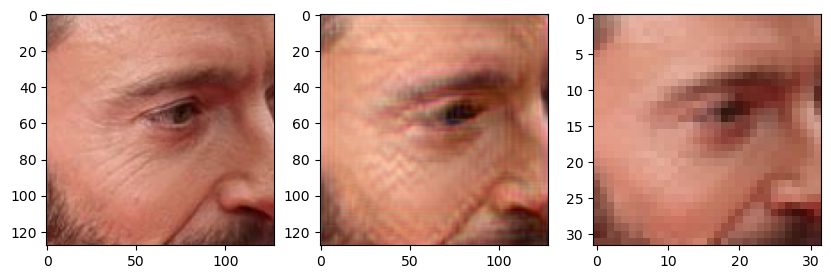

epoch: 690
{'gp': '0.3558', 'critic': '-13.1764', 'l1': '0.0005', 'vgg': '0.2138', 'adversarial': '0.0673'}




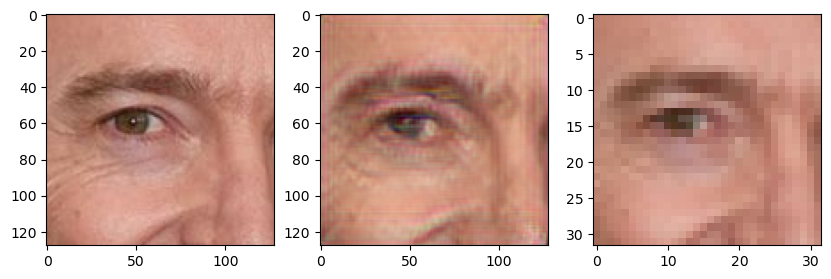

epoch: 700
{'gp': '0.1593', 'critic': '-12.6722', 'l1': '0.0005', 'vgg': '0.2735', 'adversarial': '0.0383'}




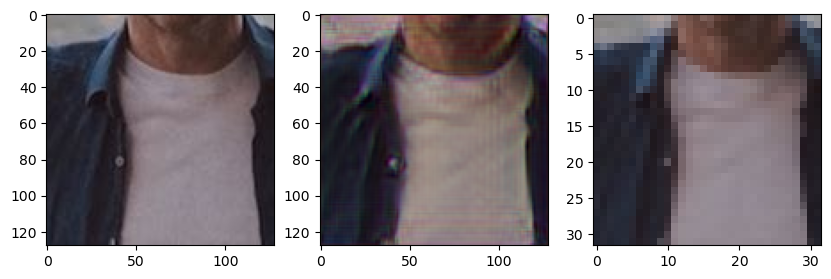

epoch: 710
{'gp': '0.4170', 'critic': '-18.1111', 'l1': '0.0006', 'vgg': '0.3687', 'adversarial': '0.0590'}




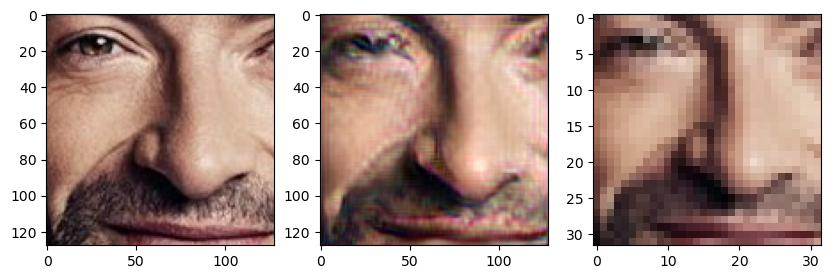

epoch: 720
{'gp': '0.2633', 'critic': '-12.6406', 'l1': '0.0005', 'vgg': '0.2221', 'adversarial': '0.1368'}




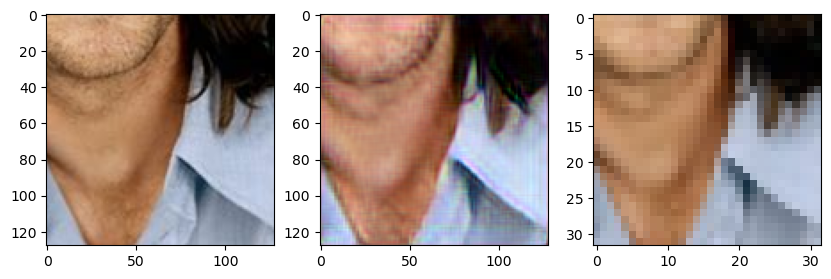

epoch: 730
{'gp': '0.3099', 'critic': '-11.9792', 'l1': '0.0004', 'vgg': '0.1638', 'adversarial': '0.0699'}




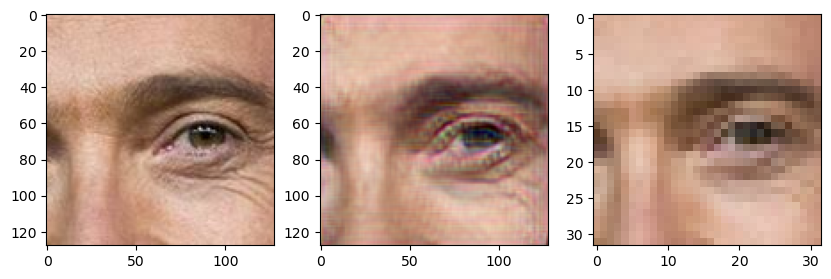

epoch: 740
{'gp': '0.2644', 'critic': '-13.6370', 'l1': '0.0005', 'vgg': '0.1538', 'adversarial': '0.1027'}




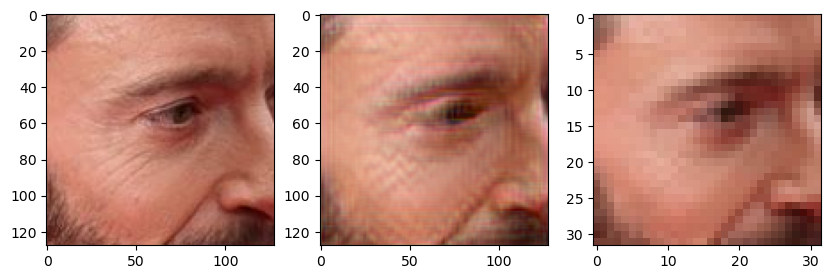

epoch: 750
{'gp': '0.2854', 'critic': '-15.3496', 'l1': '0.0005', 'vgg': '0.2288', 'adversarial': '0.1239'}




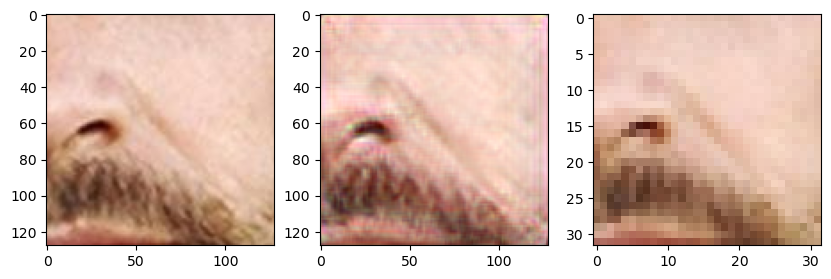

epoch: 760
{'gp': '0.1508', 'critic': '-10.9213', 'l1': '0.0004', 'vgg': '0.2148', 'adversarial': '0.0745'}




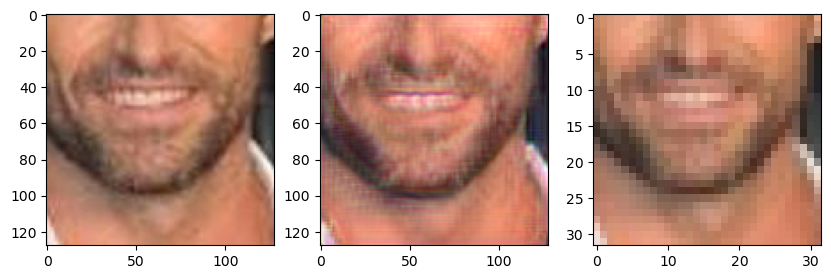

epoch: 770
{'gp': '0.2335', 'critic': '-12.8679', 'l1': '0.0006', 'vgg': '0.2230', 'adversarial': '-0.0073'}




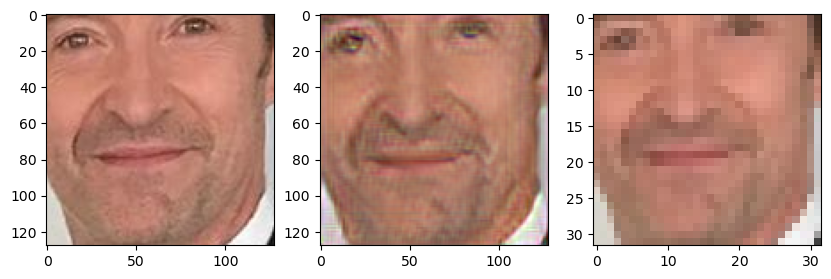

epoch: 780
{'gp': '0.1224', 'critic': '-8.9166', 'l1': '0.0003', 'vgg': '0.1483', 'adversarial': '0.0400'}




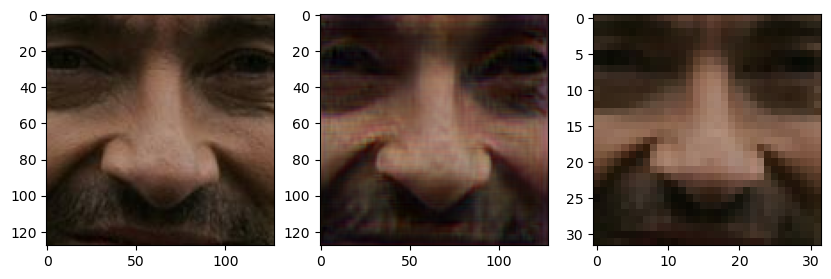

epoch: 790
{'gp': '0.3457', 'critic': '-12.5197', 'l1': '0.0005', 'vgg': '0.1617', 'adversarial': '0.0575'}




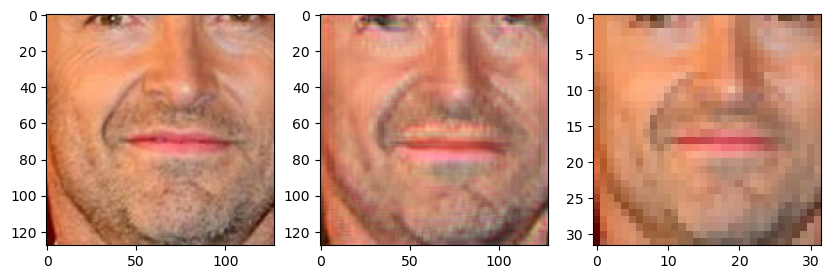

epoch: 800
{'gp': '0.1879', 'critic': '-11.8471', 'l1': '0.0004', 'vgg': '0.1760', 'adversarial': '0.0468'}




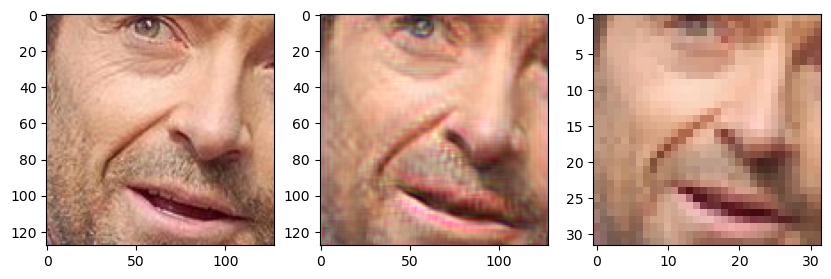

epoch: 810
{'gp': '0.2140', 'critic': '-9.7902', 'l1': '0.0004', 'vgg': '0.2006', 'adversarial': '0.0673'}




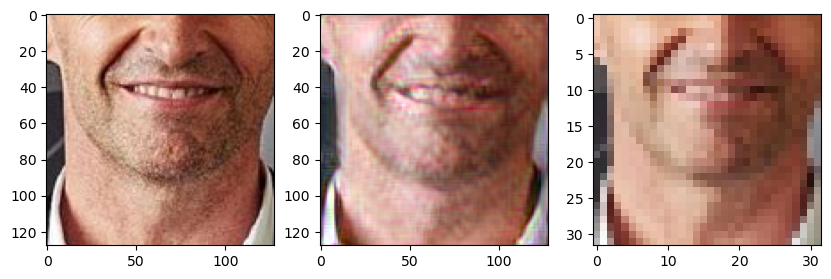

epoch: 820
{'gp': '0.3401', 'critic': '-14.8333', 'l1': '0.0005', 'vgg': '0.2191', 'adversarial': '0.0701'}




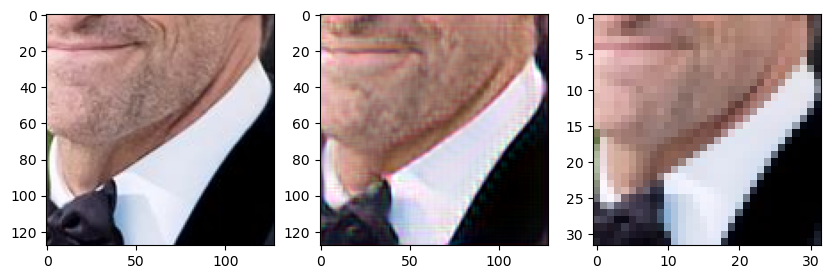

epoch: 830
{'gp': '0.1777', 'critic': '-9.6606', 'l1': '0.0004', 'vgg': '0.2262', 'adversarial': '0.0521'}




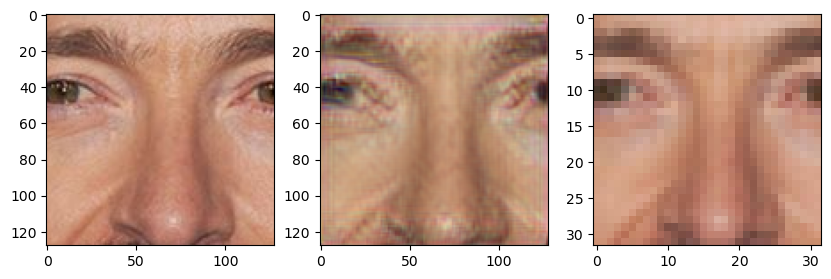

epoch: 840
{'gp': '0.3183', 'critic': '-8.5358', 'l1': '0.0004', 'vgg': '0.1689', 'adversarial': '0.0921'}




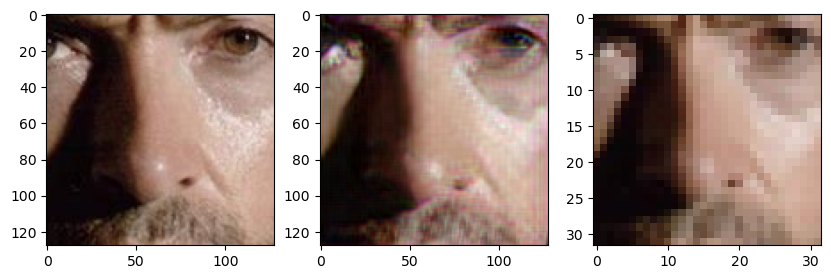

epoch: 850
{'gp': '0.3441', 'critic': '-14.2780', 'l1': '0.0005', 'vgg': '0.1548', 'adversarial': '0.0512'}




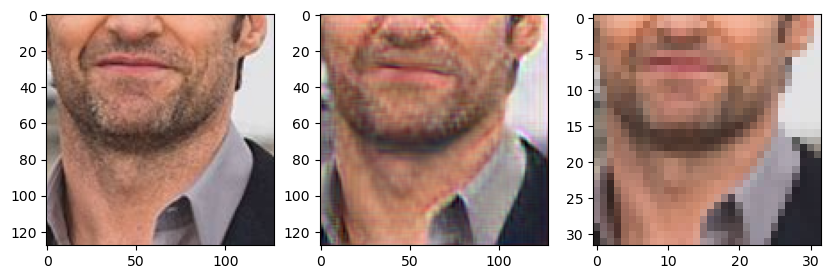

epoch: 860
{'gp': '0.2673', 'critic': '-10.9126', 'l1': '0.0004', 'vgg': '0.1567', 'adversarial': '0.0640'}




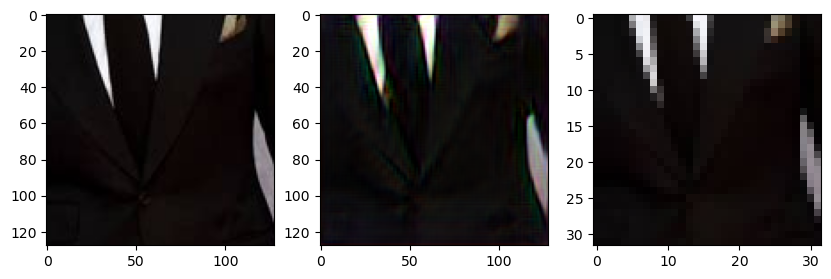

epoch: 870
{'gp': '0.2787', 'critic': '-10.4006', 'l1': '0.0004', 'vgg': '0.1625', 'adversarial': '0.0747'}




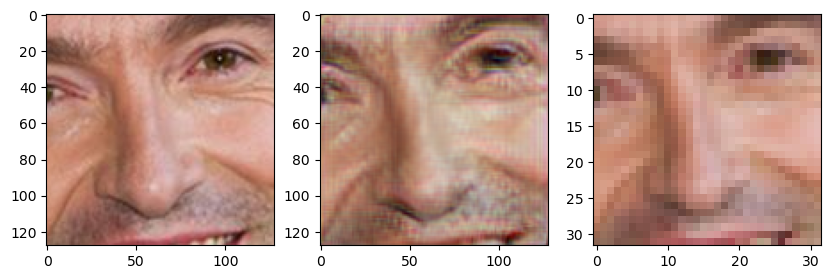

epoch: 880
{'gp': '0.8303', 'critic': '-11.6344', 'l1': '0.0005', 'vgg': '0.1964', 'adversarial': '0.0867'}




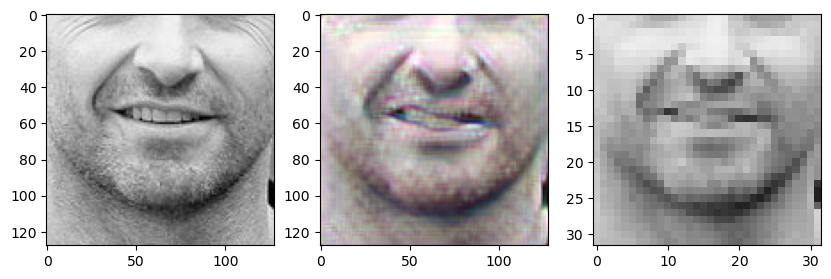

epoch: 890
{'gp': '0.4337', 'critic': '-16.0688', 'l1': '0.0005', 'vgg': '0.1491', 'adversarial': '0.0599'}




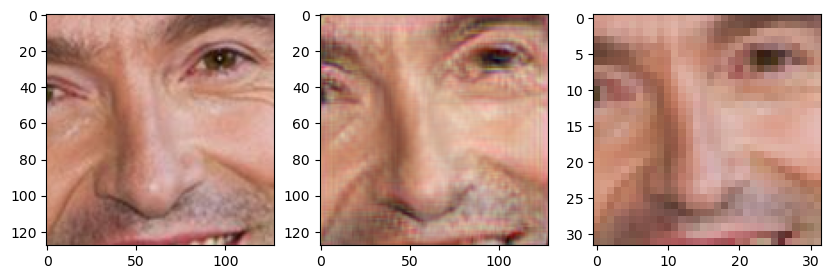

epoch: 900
{'gp': '0.1852', 'critic': '-11.8431', 'l1': '0.0005', 'vgg': '0.1312', 'adversarial': '0.1139'}




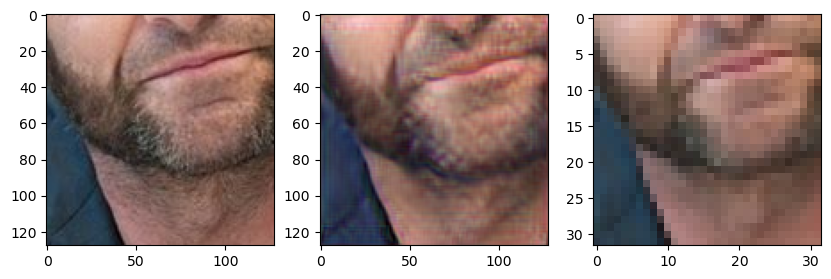

epoch: 910
{'gp': '0.3066', 'critic': '-13.3251', 'l1': '0.0005', 'vgg': '0.2255', 'adversarial': '0.0307'}




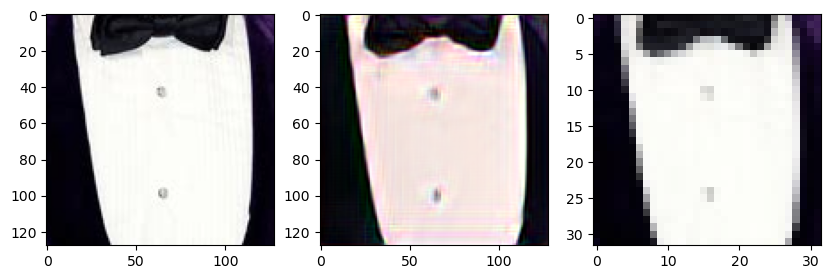

epoch: 920
{'gp': '0.2480', 'critic': '-12.5900', 'l1': '0.0005', 'vgg': '0.1648', 'adversarial': '0.0409'}




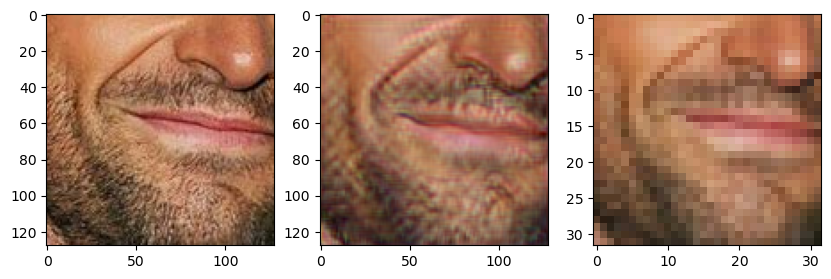

epoch: 930
{'gp': '0.4077', 'critic': '-11.5951', 'l1': '0.0004', 'vgg': '0.1622', 'adversarial': '0.0818'}




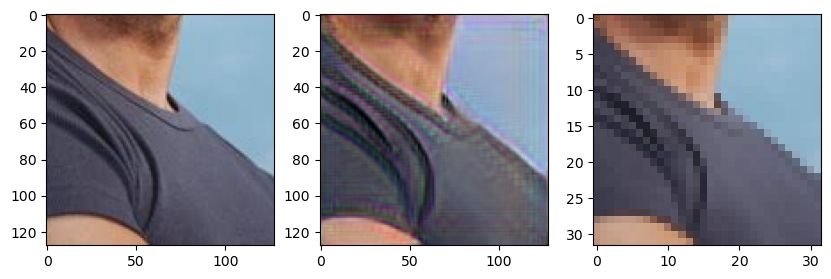

epoch: 940
{'gp': '0.2037', 'critic': '-13.9086', 'l1': '0.0004', 'vgg': '0.1703', 'adversarial': '0.0320'}




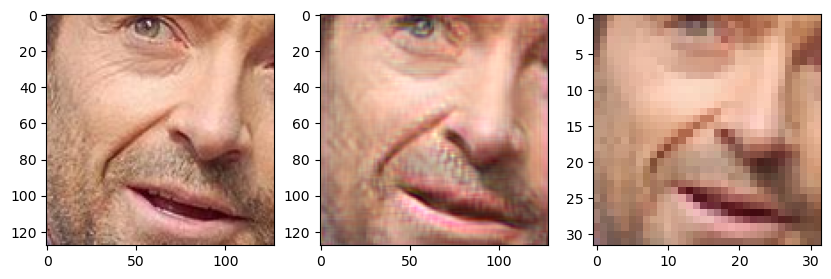

epoch: 950
{'gp': '0.1840', 'critic': '-10.7853', 'l1': '0.0004', 'vgg': '0.1703', 'adversarial': '0.0680'}




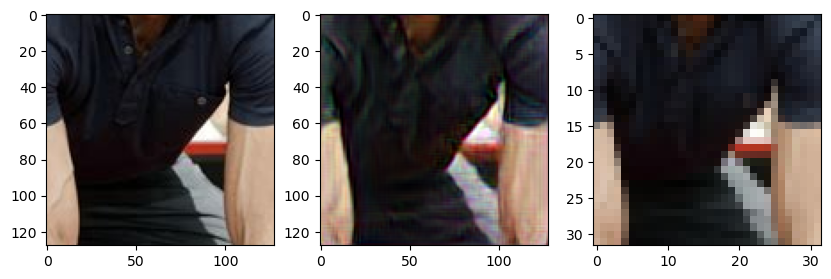

epoch: 960
{'gp': '0.2270', 'critic': '-8.6748', 'l1': '0.0004', 'vgg': '0.1592', 'adversarial': '0.0696'}




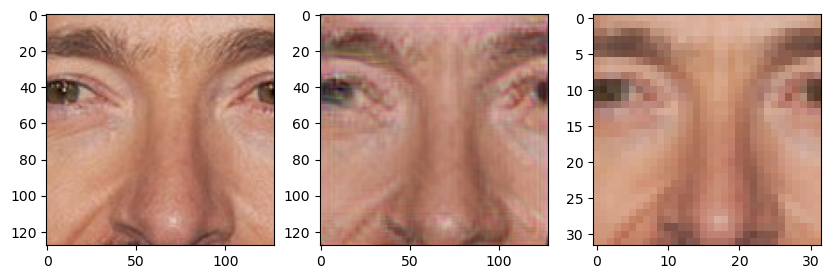

epoch: 970
{'gp': '0.1577', 'critic': '-11.9461', 'l1': '0.0004', 'vgg': '0.1479', 'adversarial': '0.0479'}




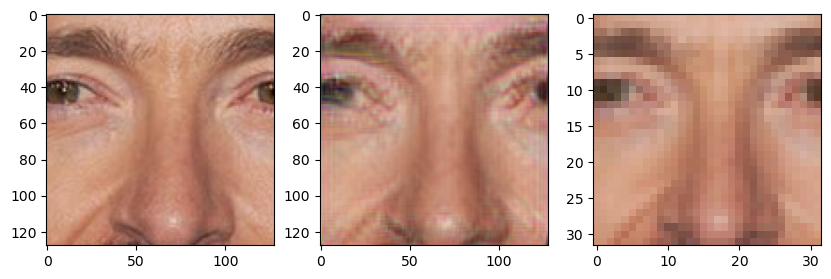

epoch: 980
{'gp': '0.2417', 'critic': '-14.6304', 'l1': '0.0005', 'vgg': '0.1849', 'adversarial': '0.0420'}




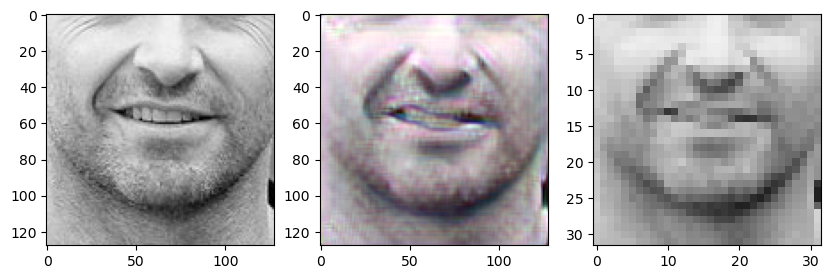

epoch: 990
{'gp': '0.2343', 'critic': '-13.3520', 'l1': '0.0005', 'vgg': '0.1935', 'adversarial': '0.0074'}




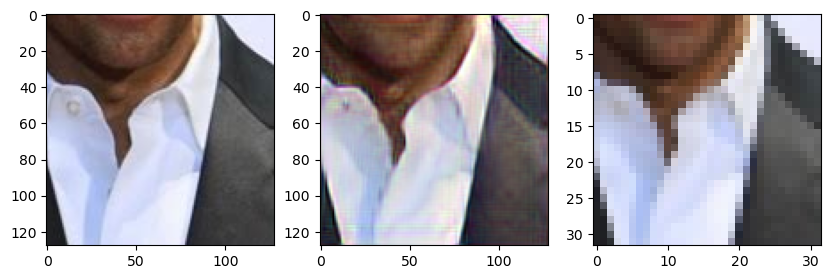

In [8]:
paths = os.listdir("/celebrity-face-image-dataset/Celebrity Faces Dataset/Hugh Jackman")
dataset = customdataset(paths)
loader = DataLoader(
        dataset,
        batch_size=8,
        shuffle=True,
        pin_memory=True,
        num_workers=config.NUM_WORKERS,
    )
gen = Generator(in_channels=3).to(config.DEVICE)
disc = Discriminator(in_channels=3).to(config.DEVICE)
initialize_weights(gen)
opt_gen = optim.Adam(gen.parameters(), lr=config.LEARNING_RATE, betas=(0.0, 0.9))
opt_disc = optim.Adam(disc.parameters(), lr=config.LEARNING_RATE, betas=(0.0, 0.9))
l1 = nn.L1Loss()
vgg_loss = VGGLoss()
training = True #False if using pretrained weights
if training:
    train()
else:
    checkpoint = torch.load(config.Pretrained_Weights , map_location=config.DEVICE)
    gen.load_state_dict(checkpoint["state_dict"])
    image = Image.open("Images//image.jpg")
    image = highres(image = np.array(image))
    image_high = gen(image["image"].unsqueeze(0).to(config.DEVICE)) 
    plt.imshow(torch.permute(image_high[0].cpu().detach() , ( 1 ,2 , 0)))